In [1]:
import numpy as np
import torch 
from framework.SMS import import_dataset_fromSMS
import networkx as nx

distance_mode = "dijkstra" # "linear_interpolation" or "dijkstra"

datasetName = "swiss1"
datasetSuffix = "-500"
datasetPath = "data/SMS/" + datasetName  + datasetSuffix + "/"
datasetSMS = import_dataset_fromSMS(datasetPath)

CORRUPTED_NODES = 70

sim = list(datasetSMS.keys())[0]
mat = datasetSMS[sim]['adjacency_matrix']
num_nodes = mat.shape[0]
p_vectors_array = datasetSMS[sim]['p_array']
dimP = p_vectors_array.shape[1]

torch_points_labels=torch.tensor([0]*(num_nodes-CORRUPTED_NODES) + [1]*CORRUPTED_NODES)


#plot_graph_from_adjacency_matrix(mat, node_color_scalars=np.sum(p_vectors_array, axis=1), cmap='plasma')

def read_matrix_from_csv_loadtxt(filepath, delimiter=','):
  """
  Reads a NumPy matrix from a CSV file using np.loadtxt().

  Args:
    filepath (str): The path to the CSV file.
    delimiter (str): The character separating values in the CSV file (default is comma).

  Returns:
    numpy.ndarray: The matrix read from the CSV file.
  """
  try:
    matrix = np.loadtxt(filepath, delimiter=delimiter)
    print(f"Successfully loaded matrix from {filepath} using np.loadtxt().")
    return matrix
  except FileNotFoundError:
    print(f"Error: The file '{filepath}' was not found.")
    return None
  except Exception as e:
    print(f"An error occurred while loading the file: {e}")
    return None


path = "data/SMS/" + datasetName  + datasetSuffix +"/sim_" + str(sim)+ "/" + datasetName
p_vectors_array = (read_matrix_from_csv_loadtxt(path + "_p_matrix.csv"))
true_p_vectors_array = (read_matrix_from_csv_loadtxt(path + "_true_p_matrix.csv"))
dimP = p_vectors_array.shape[1]
for x in datasetSMS.values():
    x["p_array"]=p_vectors_array


Successfully loaded matrix from data/SMS/swiss1-500/sim_4390/swiss1_p_matrix.csv using np.loadtxt().
Successfully loaded matrix from data/SMS/swiss1-500/sim_4390/swiss1_true_p_matrix.csv using np.loadtxt().


In [2]:
from framework.trainFct import *
from torch_geometric.data import Data
from framework.visuals import *
from scipy.sparse.csgraph import shortest_path


latent_dim = 2
input_dim = dimP
batch_size = 16

encoder_hidden_dims=[128, 64, 32]
adj_decoder_hidden_dims=[64, 64, 32]
node_decoder_hidden_dims=[64, 64, 32]
gcn_layers=3
fc_layers=2

dataset = []
for x in datasetSMS.values():
    # Create PyG data object
    x["distance_matrix"] = shortest_path(-np.log(np.maximum(x["adjacency_matrix"], 1e-7)), directed=False, unweighted=False, method="D")
    data = Data(x=torch.tensor(x["p_array"], dtype=torch.float), 
                edge_index=adj_matrix_to_edge_index(x["distance_matrix"])[0], 
                edge_labels=adj_matrix_to_edge_index(x["distance_matrix"])[1],
                adjacency_matrix=torch.tensor(x["distance_matrix"]))
    dataset.append(data)

# Select a single graph to train on
single_graph = dataset[0]

# Wrap in list for compatibility with DataLoader-like expectations
single_graph_list = [single_graph]


dist_mat = shortest_path(-np.log(np.maximum(x["adjacency_matrix"], 1e-7)), directed=False, unweighted=False, method="D")

G = nx.from_numpy_array(dist_mat)
G.remove_edges_from(nx.selfloop_edges(G)) # Remove self-loops


/Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch_geometric/typing.py:128: UserWarning: An issue occurred while importing 'torch-scatter'. Disabling its usage. Stacktrace: dlopen(/Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch_scatter/_scatter_cpu.so, 0x0006): Symbol not found: __ZN2at4_ops16div__Tensor_mode4callERNS_6TensorERKS2_NSt3__18optionalINS6_17basic_string_viewIcNS6_11char_traitsIcEEEEEE
  Referenced from: <2BF76774-0954-3F15-B7FE-8A5E5111D7DF> /Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch_scatter/_scatter_cpu.so
  Expected in:     <A51C8C05-245A-3989-8D3C-9A6704422CA5> /Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch/lib/libtorch_cpu.dylib
  warnings.warn(f"An issue occurred while importing 'torch-scatter'. "
/Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch_geometric/typing.py:166: UserWarning: An issue occurred while importing 'torch-sparse'. Disabling its usage. Stacktrace: dlopen(/

In [3]:
phase1_epochs = 1500
phase2_epochs = 200
lr_phase1 = 0.005
latent_dim = 2
device = "cuda" if torch.cuda.is_available() else "cpu"

encoder = MLPEncoder(
    input_dim=input_dim,
    hidden_dims=[16, 16],
    latent_dim=latent_dim,
    mlp_layers=2,
    dropout=0.2,
    activation=nn.ELU()
)


node_decoder = NodeAttributeVariationalDecoder(
    latent_dim=latent_dim,
    output_dim=input_dim,
    #hidden_dims=[5000, 128],
    #hidden_dims=[2000, 128],
    hidden_dims=[16],
    dropout=0,
    activation=nn.ELU(),
)

# Create KL annealing scheduler
kl_scheduler = KLAnnealingScheduler(
    anneal_start=0.0,
    #anneal_end=0.001,
    #anneal_end=0.8,
    anneal_end=2,
    anneal_steps=phase1_epochs * len(single_graph_list),
    anneal_type='sigmoid',
)

# Create initial model with only node decoder
model_phase1 = GraphVAE(
    encoder=encoder,
    decoders=[node_decoder],
    kl_scheduler=kl_scheduler,
    compute_latent_manifold=False,
)


In [4]:
import os

if os.path.exists("model_phase1_swissSMS.pth"):
    print("Loading pretrained model")
    model_phase1.load_state_dict(torch.load('model_phase1_swissSMS.pth'))
else:
    print("=== Starting Phase 1: Training encoder with node feature reconstruction ===")

    # Phase 1 training
    history_phase1 = train_phase1(
        model=model_phase1,
        data_loader=single_graph_list,
        num_epochs=phase1_epochs,
        lr=lr_phase1,
        weight_decay=1e-5,
        verbose=True,
        device=device,
        loss_coefficient=1
    )

    print("\n=== Phase 1 Complete ===")

    torch.save(model_phase1.state_dict(), 'model_phase1_swissSMS.pth')
    print("\n=== Phase 1 Saved ===")

    visualize_training(history_phase1)
    visualize_node_features_reconstruction(model_phase1, single_graph, sample_features=dimP)
    visualize_latent_space(model_phase1, [single_graph])


Loading pretrained model


/var/folders/qc/fbm2wz190nqd87d2mq7l90_80000gn/T/ipykernel_66618/449094116.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_phase1.load_state_dict(torch.load('model

Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 5166.93it/s]


Completed. Cached 10201 / 10201 points.


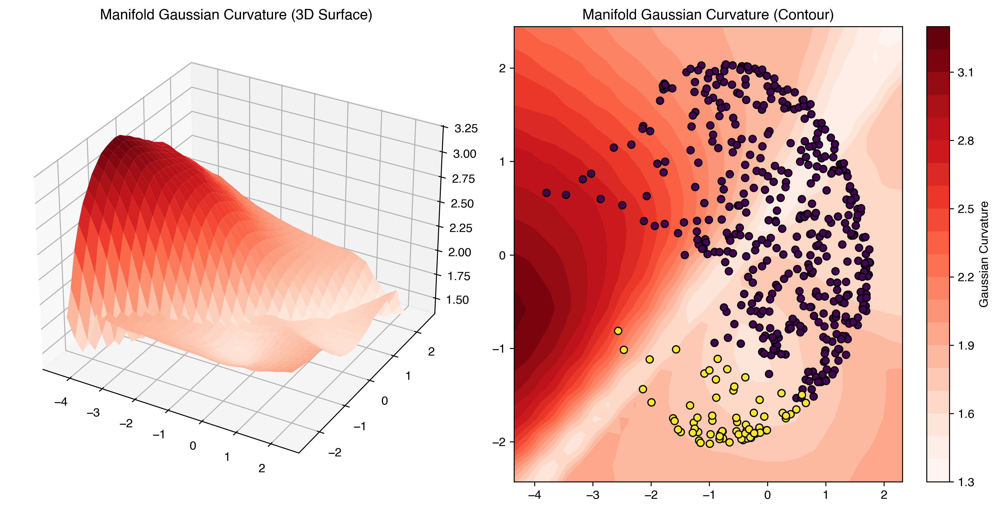

Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

In [5]:
import copy
from framework.torchVersions.distanceApproximations import DistanceApproximations
from framework.boundedManifold import BoundedManifold

model_phase1 = model_phase1.to('cpu')
model_phase1.encoder.eval()
model_phase2 = copy.deepcopy(model_phase1)

model_phase1.eval()

with torch.no_grad():
    x = single_graph.x.to(device)
    edge_index = single_graph.edge_index.to(device)
    latent_mu = model_phase1.encode(x, edge_index=edge_index)

latent_points = latent_mu[0]

model_phase1.set_compute_latent_manifold(True)
model_phase1.construct_latent_manifold(bounds=BoundedManifold.hypercube_bounds(latent_points, margin=0.1, relative=True), force=True)
model_phase1.get_latent_manifold().compute_full_grid_metric_tensor()
model_phase1.get_latent_manifold().visualize_manifold_curvature(data_points=latent_points, labels=torch.tensor([0]*(num_nodes-CORRUPTED_NODES) + [1]*CORRUPTED_NODES))

with torch.no_grad():
    if distance_mode == "linear_interpolation":
        dists_phase1 = model_phase1.get_latent_manifold().create_riemannian_distance_matrix(latent_points, 
                                                                                            DistanceApproximations.linear_interpolation_distance, num_points=20)
    elif distance_mode == "dijkstra":
        dists_phase1 = model_phase1.get_latent_manifold().get_grid_as_graph().compute_shortest_paths(
                            latent_points,
                            weight_type="geodesic",  # Uses your metric tensors
                            max_grid_neighbors=8,     # Connect to up to 8 nearest grid nodes
                            num_threads=6
                        )


In [6]:

class ManifoldHeatKernelDecoder(DecoderBase):
    """
    Fictive decoder that outputs latent codes but computes a meaningful loss 
    based on manifold heat kernel divergence with graph Laplacian.
    """
    def __init__(
        self, 
        latent_dim: int,
        distance_mode: str = "linear_interpolation",  # or "direct" or "dijkstra"
        num_integration_points: int = 25,
        name: str = "manifold_heat_kernel_decoder",
        num_heat_time: int = 20,  # Time parameter for heat kernel
        num_eigenvalues: int = 50,  # Number of eigenvalues to compute
        laplacian_regularization: float = 1e-8,
        manifold_neighbors: int = 7,  # How many nearest neighbors to connect in manifold
        ema_lag_factor: float = 0.08,
        max_ema_epochs : int = 300,
        ema_inactivity_threshold: int = 20,
        dist_distorsion_penalty: float = 0.0,
        retain_high_freq_threshold: float = 0.9,
        suppress_low_freq_threshold: float = 5e-3,
    ):
        super(ManifoldHeatKernelDecoder, self).__init__(latent_dim, name)
        
        self.distance_mode = distance_mode
        self.num_integration_points = num_integration_points
        self.model = None  # Weak reference to the model instance

        self.num_heat_time = num_heat_time
        self.num_eigenvalues = num_eigenvalues
        self.laplacian_regularization = laplacian_regularization
        self.manifold_neighbors = manifold_neighbors
        self.sigma_ema = None
        self.L_graph = None
        self.K_graph = None
        self.lag_factor = ema_lag_factor
        self.first_sigma = None
        self.heat_times = None
        self.freeze_sigma = 0
        self.sigma_inactivity_threshold = ema_inactivity_threshold
        self.max_ema_epochs = max_ema_epochs
        self.ema_epochs = 0
        self.mean_distance = None
        self.dist_distorsion_penalty = dist_distorsion_penalty
        self.retain_high_freq_threshold = retain_high_freq_threshold
        self.suppress_low_freq_threshold = suppress_low_freq_threshold

    def giveVAEInstance(self, model):
        self.model = weakref.ref(model)

    def forward(self, z: torch.Tensor, **kwargs) -> Dict[str, torch.Tensor]:
        """Forward pass - simply returns the latent codes (fictive decoder)"""
        return {"latent_codes": z.clone()}
        
    def _riemannian_distance(self, z1: torch.Tensor, z2: torch.Tensor) -> torch.Tensor:
        #print(f"[riemannian_distance] Computing pairwise distances for batch size {z.shape[0]}")
        #start_time = time.time()
        if self.model is None or self.model() is None:
            raise ValueError("Model instance not set. Call giveVAEInstance(model) first.")
        model = self.model()

        distances = []
        if z1.ndim == 1:
            z1 = z1.unsqueeze(0)
        if z2.ndim == 1:
            z2 = z2.unsqueeze(0)
        if self.distance_mode == "linear_interpolation":
            return model.get_latent_manifold().linear_interpolation_distance(z1, z2, num_points=self.num_integration_points)
        else:
            for i, (u_vec, v_vec) in enumerate(zip(z1, z2)):
                if self.distance_mode == "linear_interpolation":
                    #d = DistanceApproximations.linear_interpolation_distance(model.get_latent_manifold(), u_vec, v_vec, 
                    #                                                         num_points=self.num_integration_points)
                    d = model.get_latent_manifold().linear_interpolation_distance(u_vec, v_vec, 
                                                                                    num_points=self.num_integration_points)
                else:
                    d = model.get_latent_manifold().exact_geodesic_distance(u_vec, v_vec)
                #print(f"  [distance] Sample {i}: {d.item():.4f}")
                distances.append(d)
        #print(f"[riemannian_distance] Done in {time.time() - start_time:.4f}s")
        return torch.stack(distances)
    
    def compute_distance_matrix(self, z: torch.Tensor, batch_size=8) -> torch.Tensor:
        num_nodes = z.size(0)
        device = z.device
        #print("Computing pairwise Riemannian distances...")
        if self.distance_mode == "dijkstra" or self.distance_mode == "Dijkstra":
            distances = self.model().get_latent_manifold().get_grid_as_graph().compute_shortest_paths(
                self.model().get_latent_manifold()._clamp_point_to_bounds(z),
                weight_type="geodesic",  
                max_grid_neighbors=8,     # Connect to up to 8 nearest grid nodes
                num_threads=6
            )
        else:
            distances = torch.zeros(num_nodes, num_nodes, device=z.device)
            row_indices, col_indices = torch.triu_indices(num_nodes, num_nodes, offset=1)
            total_pairs = len(row_indices)

            # Process in mini-batches
            for i in tqdm(range(0, total_pairs, batch_size), desc="Computing distances in batches"):
                batch_start = i
                batch_end = min(i + batch_size, total_pairs)

                # Get the current batch of indices
                current_row_indices = row_indices[batch_start:batch_end]
                current_col_indices = col_indices[batch_start:batch_end]

                # Extract the corresponding node embeddings for these pairs
                u_batch = z[current_row_indices]
                v_batch = z[current_col_indices]

                # Compute distances for this mini-batch
                current_batch_distances = self._riemannian_distance(
                    u_batch, v_batch
                )

                # Populate the distance matrix with the results of this batch
                distances[current_row_indices, current_col_indices] = current_batch_distances
                distances[current_col_indices, current_row_indices] = current_batch_distances # Symmetric

        return distances
    
    def get_spectral_heat_times(self, eigenvalues, num_times=5):
        # Filter out the zero eigenvalue (connected component)
        valid_eigs = eigenvalues[eigenvalues > 1e-5]
        
        lambda_max = valid_eigs.max()
        lambda_min = valid_eigs.min() # This is roughly lambda_2
        
        # Invert to get time scales
        t_min = 1.0 / lambda_max
        t_max = 1.0 / lambda_min
        
        # Create log-spaced times
        # We often multiply t_max by a factor (e.g., 2 or 4) to ensure full global coverage
        return torch.logspace(torch.log10(t_min), torch.log10(t_max * 4), num_times)
    
    def compute_loss(
        self,
        outputs: Dict[str, torch.Tensor],
        targets: Dict[str, torch.Tensor],
    ) -> torch.Tensor:
        """
        Compute loss based on heat kernel divergence between manifold and graph
        """
        z = outputs["latent_codes"]
        distances = self.compute_distance_matrix(z)
        if self.L_graph is None or self.heat_times is None:
            with torch.no_grad():
                self.L_graph = compute_graph_laplacian_from_targets(targets, normalize=True, laplacian_regularization=self.laplacian_regularization)
                if self.heat_times is None:
                    self.heat_times = self.get_spectral_heat_times(eigenvalues=torch.clamp(torch.linalg.eigvalsh(self.L_graph),min=0.0), num_times=self.num_heat_time)
                print("Selected heat times:", self.heat_times)
                self.K_graph = compute_heat_kernel_from_laplacian(self.L_graph, self.heat_times)

        dist_sq = distances.pow(2).unsqueeze(-1)
        coeffs = (4 * torch.pi * self.heat_times).pow(-self.latent_dim / 2)
        exp_term = torch.exp(-dist_sq / (4 * self.heat_times))
        kernel_stack = coeffs * exp_term
        manifold_heat_kernels = list(torch.unbind(kernel_stack, dim=-1))

        # Compute the divergence between the manifold and graph heat kernels
        divergence = 0
        for i, (K_manifold, K_graph) in enumerate(zip(manifold_heat_kernels, self.K_graph)):
            #print("For heat time", self.heat_times[i].item(), ":", torch.norm(K_manifold - K_graph, p=1))
            divergence += torch.norm(K_manifold - K_graph, p=1)
        print(f"Current HK loss: {(divergence.item()):.6f}")
        return {'final_loss': divergence}


In [7]:
from framework.KLAnnealingScheduler import NoKLScheduler

#lr_phase2 = 0.0005
lr_phase2 = 0.008
phase2_epochs = 100

print("=== Starting Phase 2: Freezing encoder and adding adjacency decoder ===")

model_phase2.set_compute_latent_manifold(True)
model_phase2.construct_latent_manifold(bounds=BoundedManifold.hypercube_bounds(latent_points, margin=0.1, relative=True), force=True)
model_phase2.set_encoder_freeze(True)


distance_decoder = ManifoldHeatKernelDecoder(
    distance_mode=distance_mode,
    latent_dim=latent_dim,
    num_eigenvalues=500,
    num_integration_points=20,
    name="adj_decoder",
    ema_lag_factor=0.005,
    num_heat_time=15,
    retain_high_freq_threshold=0.7,
    suppress_low_freq_threshold= 5e-1,
)

# Add to your GraphVAE model
model_phase2.add_decoder(distance_decoder)

# Set reference decoder (the node attribute decoder)
#model_phase2.get_decoder("adj_decoder").giveManifoldInstance(model_phase2.get_latent_manifold())
model_phase2.get_decoder("adj_decoder").giveVAEInstance(model_phase2)

# Reset KL scheduler for phase 2
model_phase2.kl_scheduler = NoKLScheduler()

# Phase 2 training
history_phase2 = train_phase2(
    model=model_phase2,
    data_loader=single_graph_list,
    latent_points=latent_points,
    num_epochs=phase2_epochs,
    lr=lr_phase2,
    weight_decay=1e-5,
#    decoder_weights={"adj_decoder": -1, "node_attr_decoder":-1 },
    decoder_weights={"adj_decoder": 1, "node_attr_decoder":0 },
    verbose=True,
    device=device
)

print("\n=== Phase 2 Complete ===")



=== Starting Phase 2: Freezing encoder and adding adjacency decoder ===

Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 5822.76it/s]


Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Selected heat times: tensor([0.9758, 1.1068, 1.2554, 1.4241, 1.6153, 1.8323, 2.0783, 2.3575, 2.6741,
        3.0332, 3.4406, 3.9027, 4.4268, 5.0213, 5.6957])
Current HK loss: 45190.304688
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 5585.21it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 41330.199219
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 5789.68it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 37841.250000
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:02<00:00, 4910.32it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 34721.671875
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 5879.38it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:01<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 31924.177734


KeyboardInterrupt: 

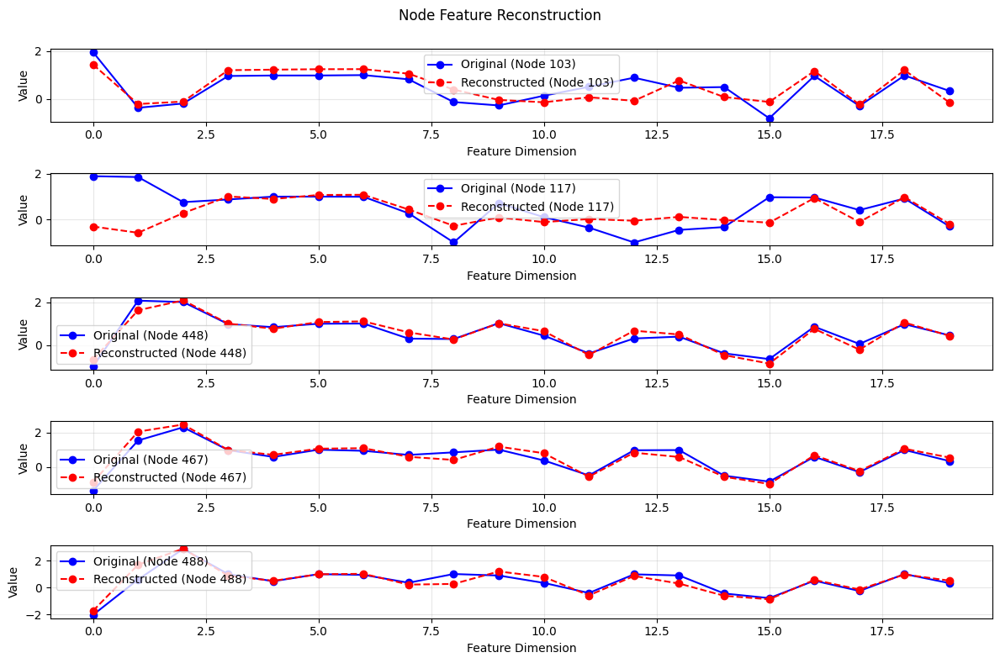

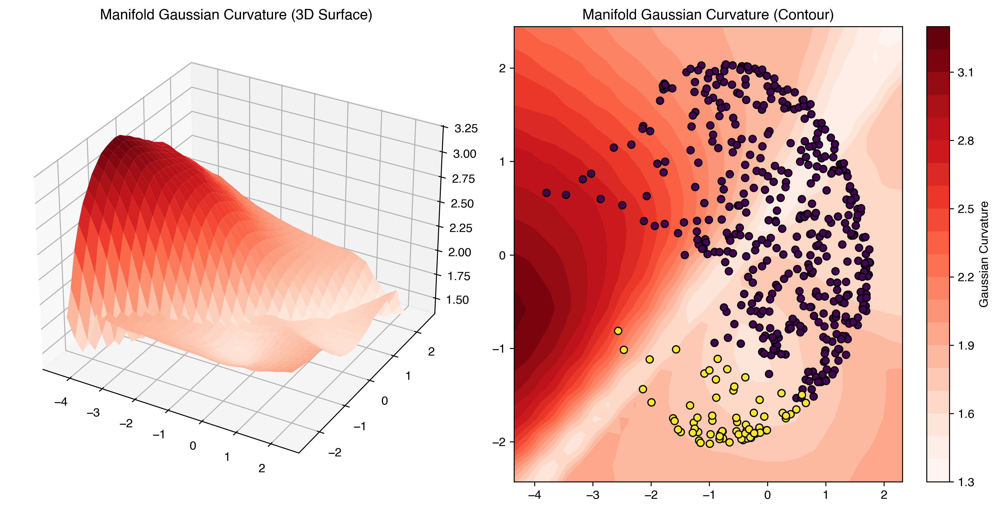

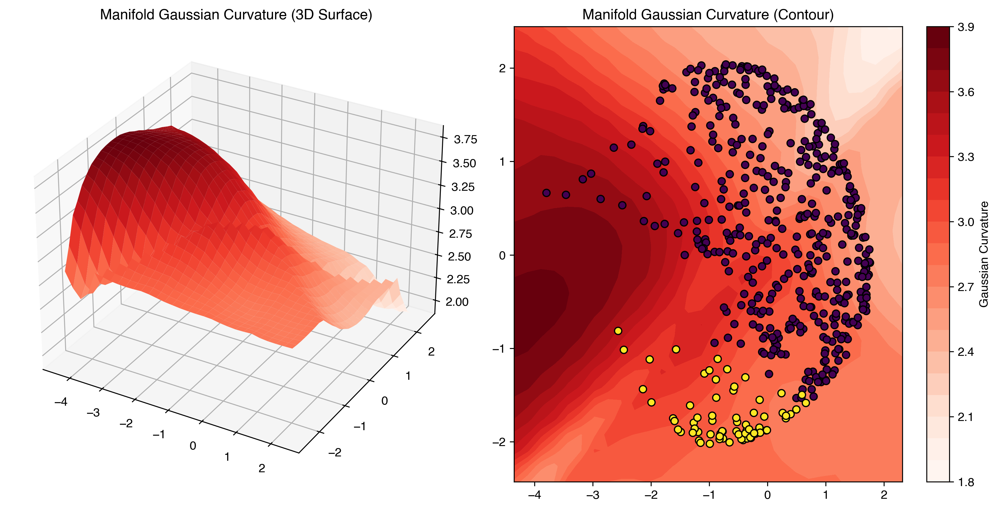

In [8]:
visualize_node_features_reconstruction(model_phase2, single_graph, sample_features=dimP)
with torch.no_grad():
    x = single_graph.x.to(device)
    edge_index = single_graph.edge_index.to(device)
    latent_mu2 = model_phase2.encode(x, edge_index=edge_index)

model_phase1.get_latent_manifold().visualize_manifold_curvature(data_points=latent_mu2[0], labels=torch_points_labels)
model_phase2.get_latent_manifold().visualize_manifold_curvature(data_points=latent_mu2[0], labels=torch_points_labels)

Full grid already computed for current epoch.
Full grid already computed for current epoch.


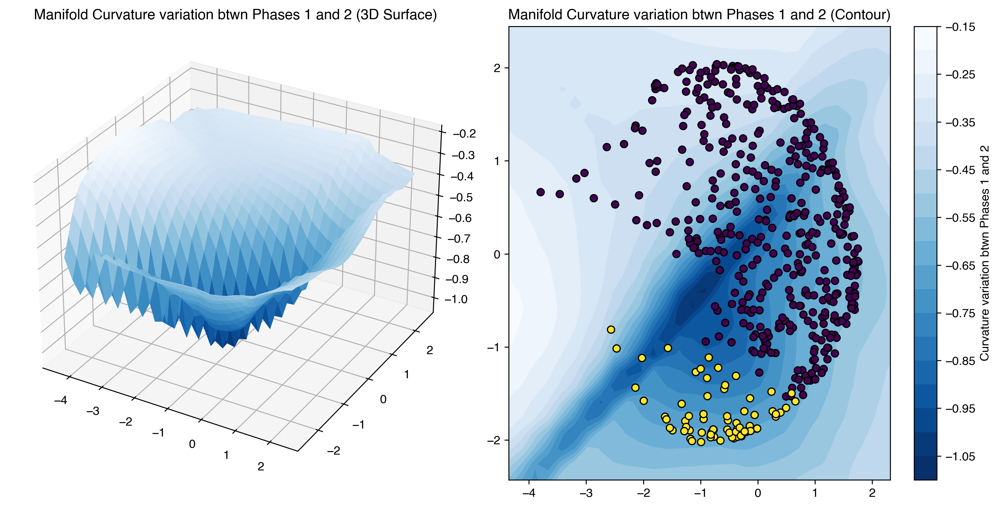

In [9]:
def compute_curvature_change(model1: GraphVAE, model2: GraphVAE):
    model1.get_latent_manifold().compute_full_grid_metric_tensor()
    model2.get_latent_manifold().compute_full_grid_metric_tensor()
    resolution = 30
    bounds_np = model1.get_latent_manifold().get_bounds().cpu().numpy()
    plot_z1 = np.linspace(bounds_np[0, 0], bounds_np[0, 1], resolution)
    plot_z2 = np.linspace(bounds_np[1, 0], bounds_np[1, 1], resolution)

    Z1_np, Z2_np = np.meshgrid(plot_z1, plot_z2)
    Z1, Z2 = torch.from_numpy(Z1_np), torch.from_numpy(Z2_np)
                
    curvature_phase1 = torch.zeros((resolution, resolution))
    curvature_phase2 = torch.zeros((resolution, resolution))

    for i in range(resolution):
        for j in range(resolution):
            z = torch.stack([Z1[i, j], Z2[i, j]])
            clamped_z = model1.get_latent_manifold()._clamp_point_to_bounds(z)
            try:
                curv_val_1 = model1.get_latent_manifold().compute_gaussian_curvature(model1.get_latent_manifold().metric_tensor(clamped_z))
                curvature_phase1[i, j] = curv_val_1
            except (ValueError, RuntimeError) as e:
                print(f"Error computing curvature at point {z}: {e}. Setting to NaN.")
                curvature_phase1[i, j] = torch.nan

            try:
                curv_val_2 = model2.get_latent_manifold().compute_gaussian_curvature(model2.get_latent_manifold().metric_tensor(clamped_z))
                curvature_phase2[i, j] = curv_val_2
            except (ValueError, RuntimeError) as e:
                print(f"Error computing curvature at point {z}: {e}. Setting to NaN.")
                curvature_phase2[i, j] = torch.nan
            
    curvature_diff = (curvature_phase1 - curvature_phase2)/(curvature_phase1 + 1e-8)
    curvature_diff = curvature_diff.detach().numpy()

    return curvature_diff, Z1_np, Z2_np
curvature_diff, Z1_np, Z2_np = compute_curvature_change(model_phase1, model_phase2)
model_phase2.get_latent_manifold()._plot_manifold_grid(curvature_diff, Z1_np, Z2_np, latent_points=latent_points, labels=torch_points_labels, name="Curvature variation btwn Phases 1 and 2")

In [10]:
with torch.no_grad():
    if distance_mode == "linear_interpolation":
        dists_phase2 = model_phase2.get_latent_manifold().create_riemannian_distance_matrix(latent_points, 
                                                                                            DistanceApproximations.linear_interpolation_distance, num_points=20)
    elif distance_mode == "dijkstra":
        dists_phase2 = model_phase2.get_latent_manifold().get_grid_as_graph().compute_shortest_paths(
                            latent_points,
                            weight_type="geodesic",  # Uses your metric tensors
                            max_grid_neighbors=8,     # Connect to up to 8 nearest grid nodes
                            num_threads=6
                        )

Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

/var/folders/qc/fbm2wz190nqd87d2mq7l90_80000gn/T/ipykernel_66618/2485397397.py:8: RuntimeWarning: invalid value encountered in divide
  res3 = np.abs((local_dists_phase1 - dists_phase2)/local_dists_phase1)


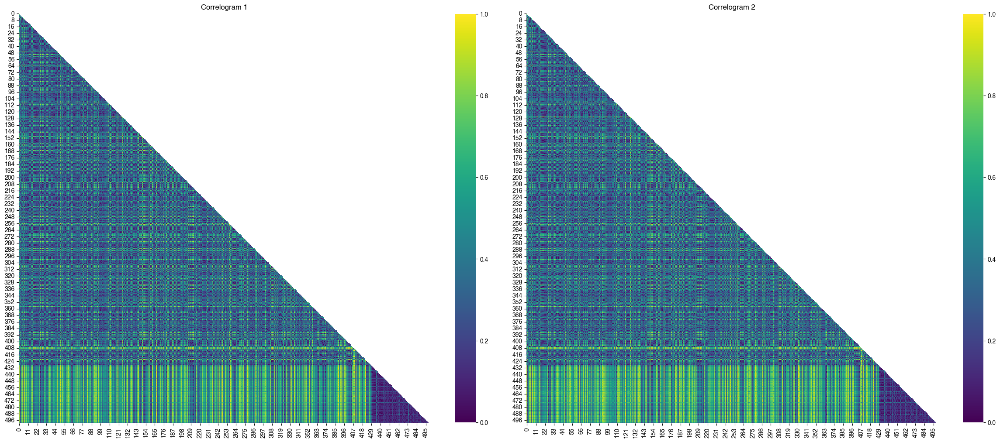

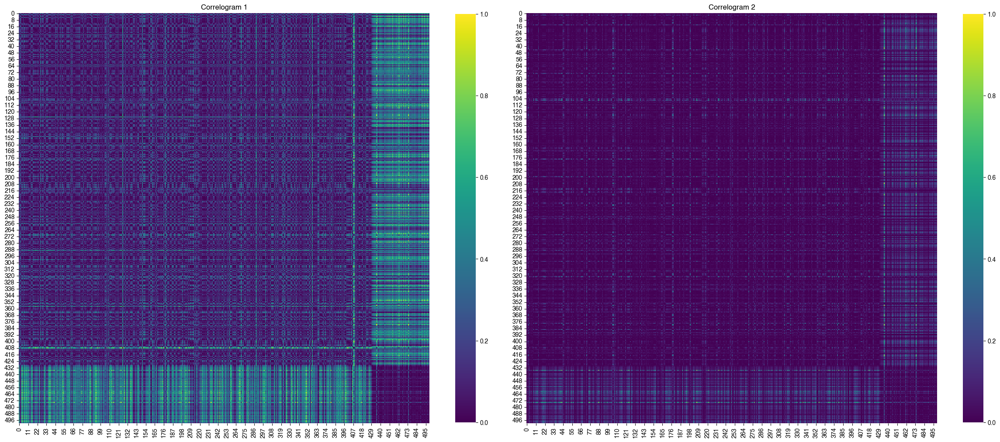

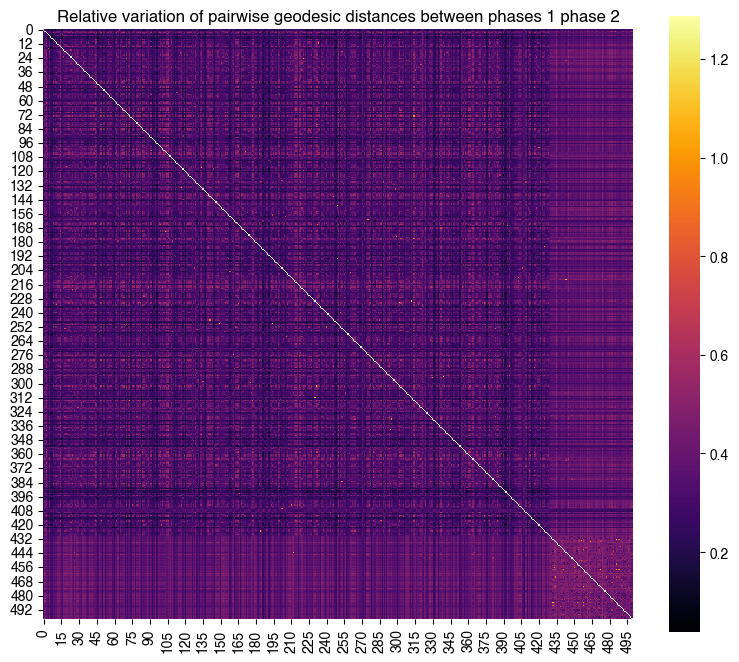

In [11]:
if isinstance(dists_phase1, torch.Tensor):
    dists_phase1 = dists_phase1.detach().numpy()
if isinstance(dists_phase2, torch.Tensor):
    dists_phase2 = dists_phase2.detach().numpy()

local_dists_phase1 = dists_phase1
res = np.abs((local_dists_phase1 - dists_phase2))
res3 = np.abs((local_dists_phase1 - dists_phase2)/local_dists_phase1)

res2 = np.abs((local_dists_phase1/np.max(np.where(local_dists_phase1 > 0, local_dists_phase1, 0)) - dists_phase2/np.max(np.where(dists_phase2 > 0, dists_phase2, 0))))

_ = plot_correlogram(local_dists_phase1/np.max(np.where(local_dists_phase1 > 0, local_dists_phase1, 0)), dists_phase2/np.max(np.where(dists_phase2 > 0, dists_phase2, 0)), remove_diagonal=True, triangular=True)

_ = plot_correlogram((res/np.max(res))**2, (res2/np.max(res2))**2)
_ = plot_correlogram(res3, cmap="inferno", titles=["Relative variation of pairwise geodesic distances between phases 1 phase 2"] )

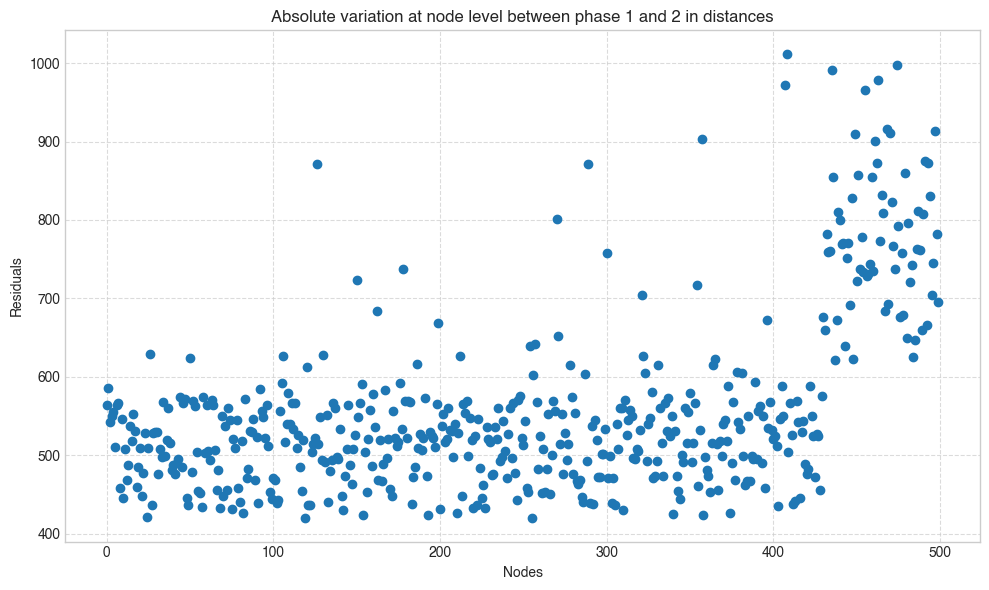

In [12]:
plt.figure(figsize=(10, 6)) # Set the size of the plot for better readability

plt.rcParams['font.family'] = 'sans-serif'
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['font.sans-serif'] = ['Helvetica', 'Arial', 'DejaVu Sans']
#plt.plot(np.sum(res, axis=0)/np.max(np.sum(res, axis=0), axis=0), marker='o', linestyle='')
#plt.plot(np.sum(res2, axis=0)/np.max(np.sum(res2, axis=0), axis=0), marker='o', linestyle='')
plt.plot(np.sum(np.nan_to_num(res, 0.0), axis=0), marker='o', linestyle='')
# Add a horizontal line at y=0

# --- Customize the Plot ---
#plt.savefig("dists_total_var_phase1_2.png", dpi=500, bbox_inches='tight')

plt.xlabel('Nodes') # Label for the x-axis
plt.ylabel('Residuals') # Label for the y-axis, updated to reflect the ratio
plt.title('Absolute variation at node level between phase 1 and 2 in distances') # Title of the plot, updated
plt.grid(True, linestyle='--', alpha=0.7) # Add a grid for easier reading
plt.tight_layout() # Adjust plot to ensure everything fits without overlapping
plt.show()